## Telecom Customer Churn 


  ### Life cycle of Machine Learning Project

   - Inderstanding the problem Statement
   - Data Collection
   - Data Checks to perform
   - Exploratory data analysis
   - Data Preprocessing
   - Model Building
   - Model Evaluation
   - Choose best model
   - Model Deployment

### 1) Problem statement

     - "Predict behavior to retain customers. You can analyze all relevant customer data and develop focused customer retention programs".

### 2) Data Collection

     - The data consists of 38 columns and  7043 rows

### 2.1 Import Data and Requuired Packages

- Importing pandas,Numpy,Matplotlib,Seaborn and Warings Library.

In [81]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#### Import the CSV Data as Pandas DataFrame

In [82]:
file_path="P:\\customer_churn\\telecom_customer_churn\\telecom_customer_churn_project\\notebook\\data\\telecom_customer_churn - telecom_customer_churn (2).csv"
df=pd.read_csv(file_path)

#### Show Top 5 records

In [83]:
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


##### Shape of the dataset

In [84]:
df.shape

(7043, 38)

In [85]:
# Customer_ID and ZIP_code are the ID
# so that we Can drop these columns

In [86]:
df.drop(columns=['Customer ID', 'Zip Code'],inplace=True)
df.shape

(7043, 36)

#### 3. Data Checks to perform

##### part 1

    - check Missing values
    - check Duplicate
    - Check data type
    - Check the number of unique values of each column
    - Check statistics of data set
    - Check various categories present in the different categorical columnm

##### 3.1 Check Missing values

In [87]:
# Check the number of unique values from all of the object datatype
df.select_dtypes(include='object').nunique()

Gender                       2
Married                      2
City                      1106
Offer                        5
Phone Service                2
Multiple Lines               2
Internet Service             2
Internet Type                3
Online Security              2
Online Backup                2
Device Protection Plan       2
Premium Tech Support         2
Streaming TV                 2
Streaming Movies             2
Streaming Music              2
Unlimited Data               2
Contract                     3
Paperless Billing            2
Payment Method               3
Customer Status              3
Churn Category               5
Churn Reason                20
dtype: int64

In [88]:
df['Offer'].isnull().sum()
# Forward fill followed by backward fill to ensure no NaN values remain
df['Offer'].ffill(inplace=True)
df['Offer'].bfill(inplace=True)
# Check for NaN values
df['Offer'].isnull().sum()

# Save the dataframe to a csv file

0

In [89]:
# Drop city column because it have alot of unique values

df.drop(columns='City',inplace=True)

df.shape

(7043, 35)

In [90]:
cat_var=df.select_dtypes(include='object').columns.tolist()
len(cat_var)

21

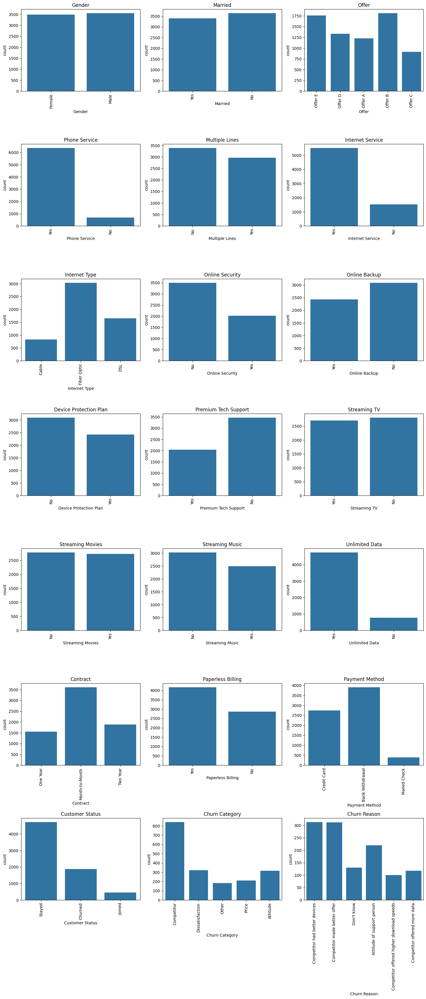

In [91]:
# Get the names of all columns with data type 'object' (categorical columns)
cat_vars = df.select_dtypes(include='object').columns.tolist()

# Create a figure with subplots
num_cols = len(cat_vars)
num_rows = (num_cols + 2) // 3  # 
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a countplot for the top 6 values of each categorical variable using Seaborn
for i, var in enumerate(cat_vars):
    top_values = df[var].value_counts().nlargest(6).index
    filtered_df = df[df[var].isin(top_values)]
    sns.countplot(x=var, data=filtered_df, ax=axs[i])
    axs[i].set_title(var)
    axs[i].tick_params(axis='x', rotation=90)

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

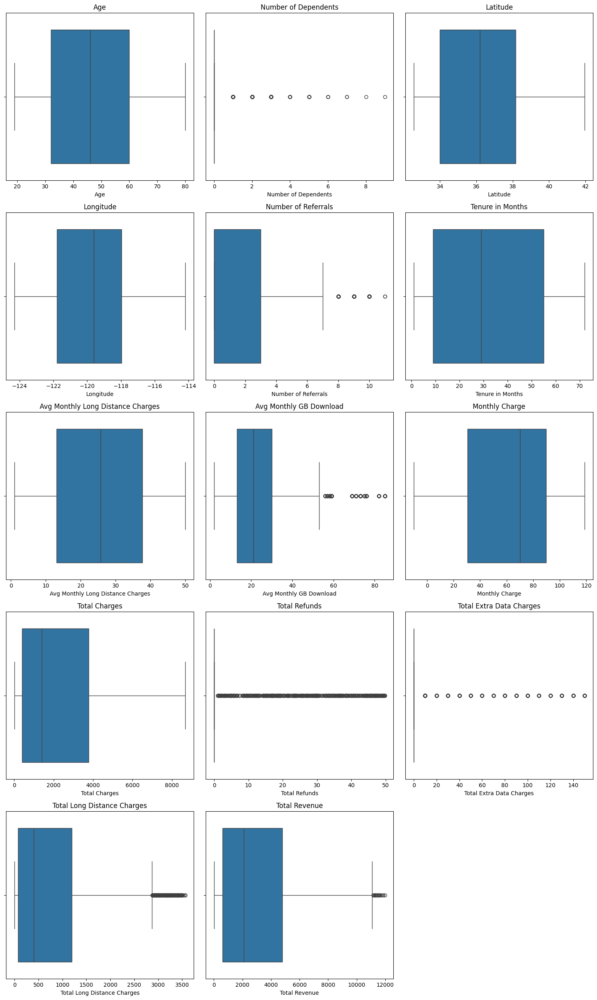

In [92]:
# Get the names of all columns with data type 'int' or 'float'
num_vars = df.select_dtypes(include=['int', 'float']).columns.tolist()

# Create a figure with subplots
num_cols = len(num_vars)
num_rows = (num_cols + 2) // 3
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a box plot for each numerical variable using Seaborn
for i, var in enumerate(num_vars):
    sns.boxplot(x=df[var], ax=axs[i])
    axs[i].set_title(var)

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

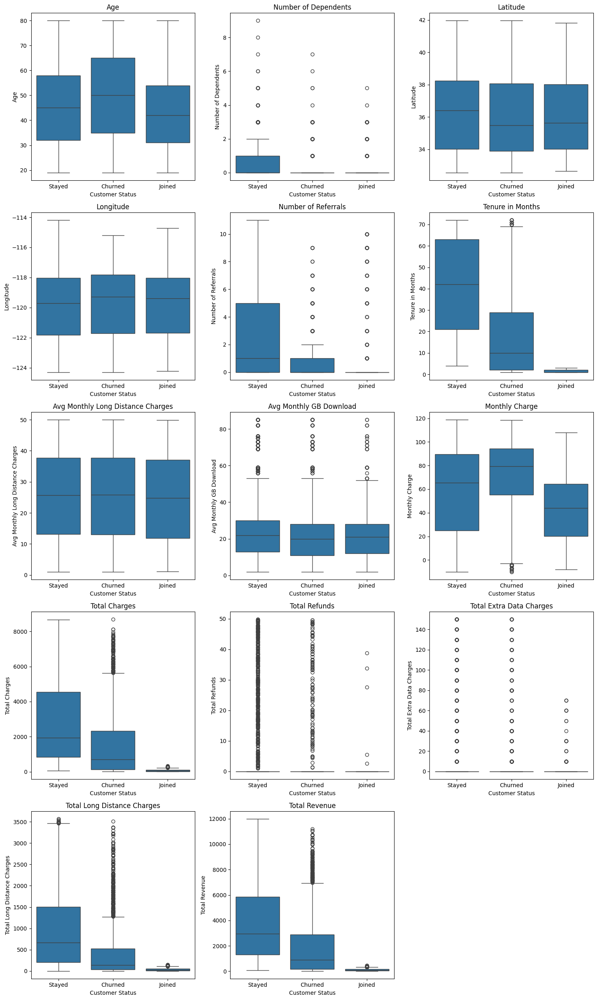

In [93]:
# Get the names of all columns with data type 'int'
int_vars = df.select_dtypes(include=['int', 'float']).columns.tolist()

# Create a figure with subplots
num_cols = len(int_vars)
num_rows = (num_cols + 2) // 3  # To make sure there are enough rows for the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a box plot for each integer variable using Seaborn with hue='attrition'
for i, var in enumerate(int_vars):
    sns.boxplot(y=var, x='Customer Status', data=df, ax=axs[i])
    axs[i].set_title(var)

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

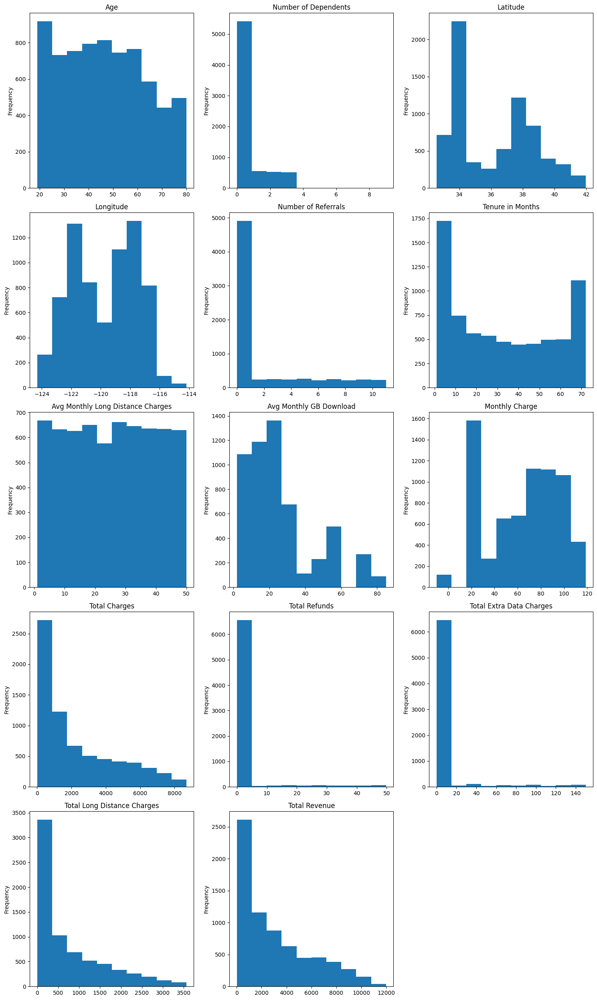

In [94]:
# Get the names of all columns with data type 'int'
int_vars = df.select_dtypes(include=['int', 'float']).columns.tolist()

# Create a figure with subplots
num_cols = len(int_vars)
num_rows = (num_cols + 2) // 3  # To make sure there are enough rows for the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a histogram for each integer variable
for i, var in enumerate(int_vars):
    df[var].plot.hist(ax=axs[i])
    axs[i].set_title(var)

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

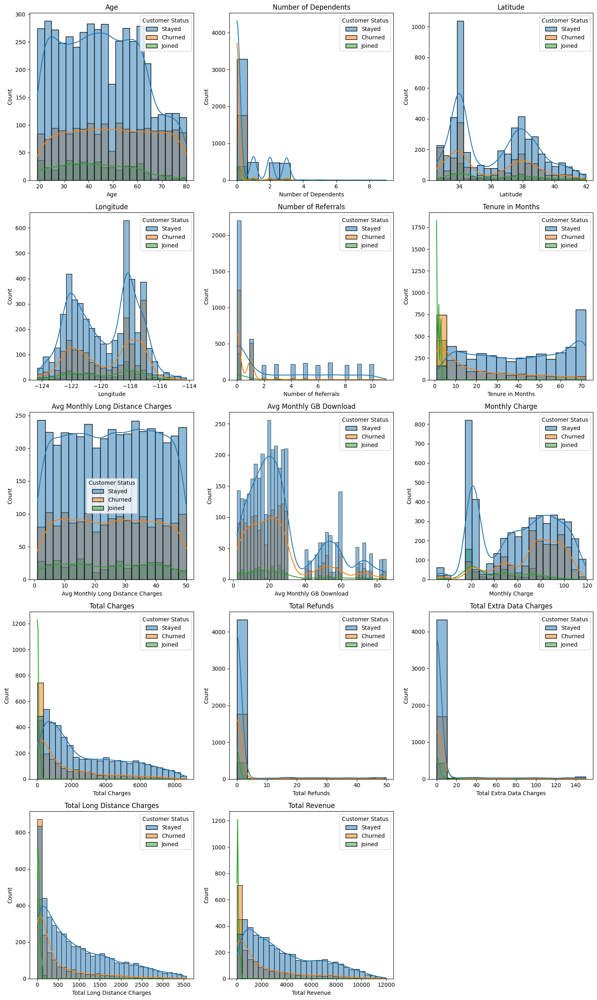

In [95]:
# Get the names of all columns with data type 'int'
int_vars = df.select_dtypes(include=['int', 'float']).columns.tolist()

# Create a figure with subplots
num_cols = len(int_vars)
num_rows = (num_cols + 2) // 3  # To make sure there are enough rows for the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a histogram for each integer variable with hue='Attrition'
for i, var in enumerate(int_vars):
    sns.histplot(data=df, x=var, 
                 hue='Customer Status', kde=True, ax=axs[i])
    axs[i].set_title(var)

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

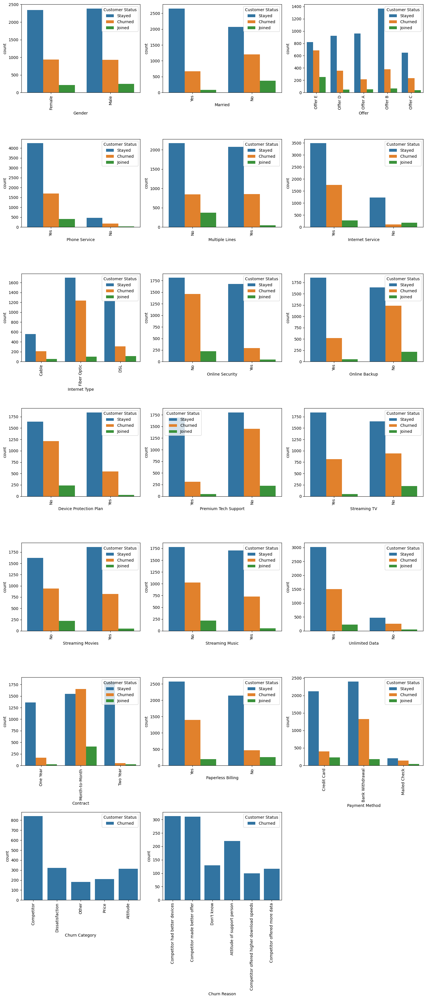

In [96]:
# Get the names of all columns with data type 'object' (categorical variables)
cat_vars = df.select_dtypes(include=['object']).columns.tolist()

# Exclude 'Attrition' from the list if it exists in cat_vars
if 'Customer Status' in cat_vars:
    cat_vars.remove('Customer Status')

# Create a figure with subplots, but only include the required number of subplots
num_cols = len(cat_vars)
num_rows = (num_cols + 2) // 3  # To make sure there are enough rows for the subplots
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5*num_rows))
axs = axs.flatten()

# Create a count plot for the top 6 values of each categorical variable
for i, var in enumerate(cat_vars):
    top_values = df[var].value_counts().nlargest(6).index
    filtered_df = df[df[var].isin(top_values)]
    sns.countplot(x=var, hue='Customer Status', data=filtered_df, ax=axs[i])
    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=90)

# Remove any remaining blank subplots
for i in range(num_cols, len(axs)):
    fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()

Categorical columns:
['Gender', 'Married', 'Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Internet Type', 'Online Security', 'Online Backup', 'Device Protection Plan', 'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing', 'Payment Method', 'Customer Status', 'Churn Category', 'Churn Reason'] 

Category distribution for Gender:

Gender
Male      3555
Female    3488
Name: count, dtype: int64 

Category distribution for Married:

Married
No     3641
Yes    3402
Name: count, dtype: int64 

Category distribution for Offer:

Offer
Offer B    1812
Offer E    1758
Offer D    1330
Offer A    1226
Offer C     917
Name: count, dtype: int64 

Category distribution for Phone Service:

Phone Service
Yes    6361
No      682
Name: count, dtype: int64 

Category distribution for Multiple Lines:

Multiple Lines
No     3390
Yes    2971
Name: count, dtype: int64 

Category distribution for Internet Service:

Inte

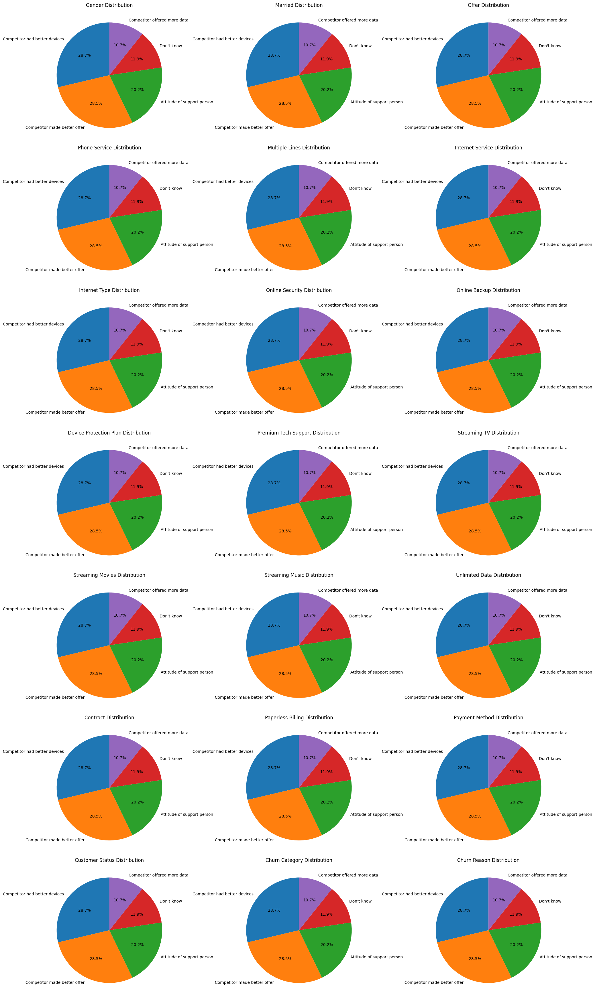

In [97]:
# Specify the maximum number of categories to show individually
max_categories = 5

# Filter categorical columns with 'object' data type
cat_cols = [col for col in df.columns if col != 'y' and df[col].dtype == 'object']

print("Categorical columns:")
print(cat_cols, "\n")

# Create a figure with subplots
num_cols = len(cat_cols)
num_rows = (num_cols + 2) // 3
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 5*num_rows))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Create a pie chart for each categorical column
for i, col in enumerate(cat_cols):
    if i < len(axs):  # Ensure we don't exceed the number of subplots
        # Count the number of occurrences for each category
        cat_counts = df[col].value_counts()

        print(f"Category distribution for {col}:\n")
        print(cat_counts, "\n")

        # Group categories beyond the top max_categories as 'Other'
        if len(cat_counts) > max_categories:
            cat_counts_top = cat_counts[:max_categories]
            cat_counts_other = pd.Series(cat_counts[max_categories:].sum(), index=['Other'])
            cat_counts_top.update(cat_counts_other)

        # Create a pie chart
        axs[i].pie(cat_counts_top, labels=cat_counts_top.index, autopct='%1.1f%%', startangle=90)
        axs[i].set_title(f'{col} Distribution')

# Remove any extra empty subplots if needed
if num_cols < len(axs):
    for i in range(num_cols, len(axs)):
        fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show plot
plt.show()

### Data preprocessing Part 2

In [98]:
## Check the amount of missing value

check_missing = df.isnull().sum()*100/df.shape[0]
check_missing[check_missing > 0 ].sort_values(ascending=False)

Churn Category                       73.463013
Churn Reason                         73.463013
Internet Type                        21.666903
Avg Monthly GB Download              21.666903
Online Security                      21.666903
Online Backup                        21.666903
Device Protection Plan               21.666903
Premium Tech Support                 21.666903
Streaming TV                         21.666903
Streaming Movies                     21.666903
Streaming Music                      21.666903
Unlimited Data                       21.666903
Avg Monthly Long Distance Charges     9.683374
Multiple Lines                        9.683374
dtype: float64

##### Drop columns with missing value more than 25%

In [99]:
columns_to_drop = ['Churn Category', 'Churn Reason']
existing_columns = [col for col in columns_to_drop if col in df.columns]

if existing_columns:
    df.drop(columns=existing_columns, inplace=True)

In [100]:
df.shape

(7043, 33)

In [101]:
# Check the amount of missing values
check_missing=df.isnull().sum() * 100/df.shape[0]
check_missing[check_missing > 0].sort_values(ascending=False)

Internet Type                        21.666903
Avg Monthly GB Download              21.666903
Online Security                      21.666903
Online Backup                        21.666903
Device Protection Plan               21.666903
Premium Tech Support                 21.666903
Streaming TV                         21.666903
Streaming Movies                     21.666903
Streaming Music                      21.666903
Unlimited Data                       21.666903
Avg Monthly Long Distance Charges     9.683374
Multiple Lines                        9.683374
dtype: float64

In [102]:
# Drop column with 21% missing value because they are in the same user that have missing value
subset_columns = ['Internet Type', 'Avg Monthly GB Download',
                  'Online Security', 'Online Backup',
                  'Device Protection Plan', 'Premium Tech Support',
                  'Streaming TV', 'Streaming Movies',
                  'Streaming Music', 'Unlimited Data']
df.dropna(subset=subset_columns, inplace=True)

# I just drop the missing values
# If you want to impute you can impute

In [103]:
df.shape

(5517, 33)

In [104]:
# Drop column with 9% missing value because they are in the same user that have missing value
subset_columns = ['Avg Monthly Long Distance Charges',
                  'Multiple Lines']
df.dropna(subset=subset_columns, inplace=True)

In [105]:
df.shape

(4835, 33)

In [106]:
# Check again the amounnt of missing value
check_missing = df.isnull().sum() * 100 / df.shape[0]
check_missing[check_missing > 0].sort_values(ascending=False)

Series([], dtype: float64)

Customer Status
Stayed     3015
Churned    1586
Joined      234
Name: count, dtype: int64


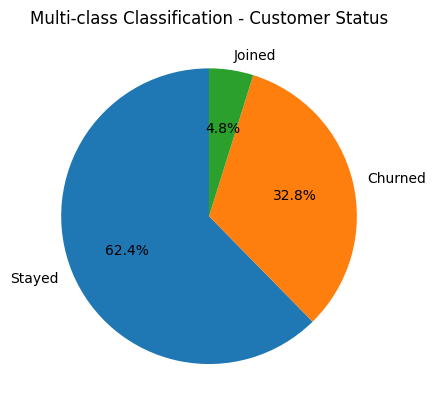

In [109]:
# Determine unique value counts in 'Customer Status'
value_counts = df['Customer Status'].value_counts()
print(value_counts)

import matplotlib.pyplot as plt
import seaborn as sns

# Check if it's multi-class classification
if len(value_counts) > 2:
    # Create a pie chart for multi-class classification
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
    plt.title('Multi-class Classification - Customer Status')
    plt.show()
else:
    print("This is not a multi-class classification problem.")






In [110]:
# Change Joined into stayed, so we can make binary classification
# Replace all values in the 'Customer Status' column with 'Stayed'
df['Customer Status'] = df['Customer Status'].replace('Joined', 'Stayed')
df['Customer Status'].value_counts()



Customer Status
Stayed     3249
Churned    1586
Name: count, dtype: int64

#### MUTIVARIATE ANALYSIS USING PAIRPLOT

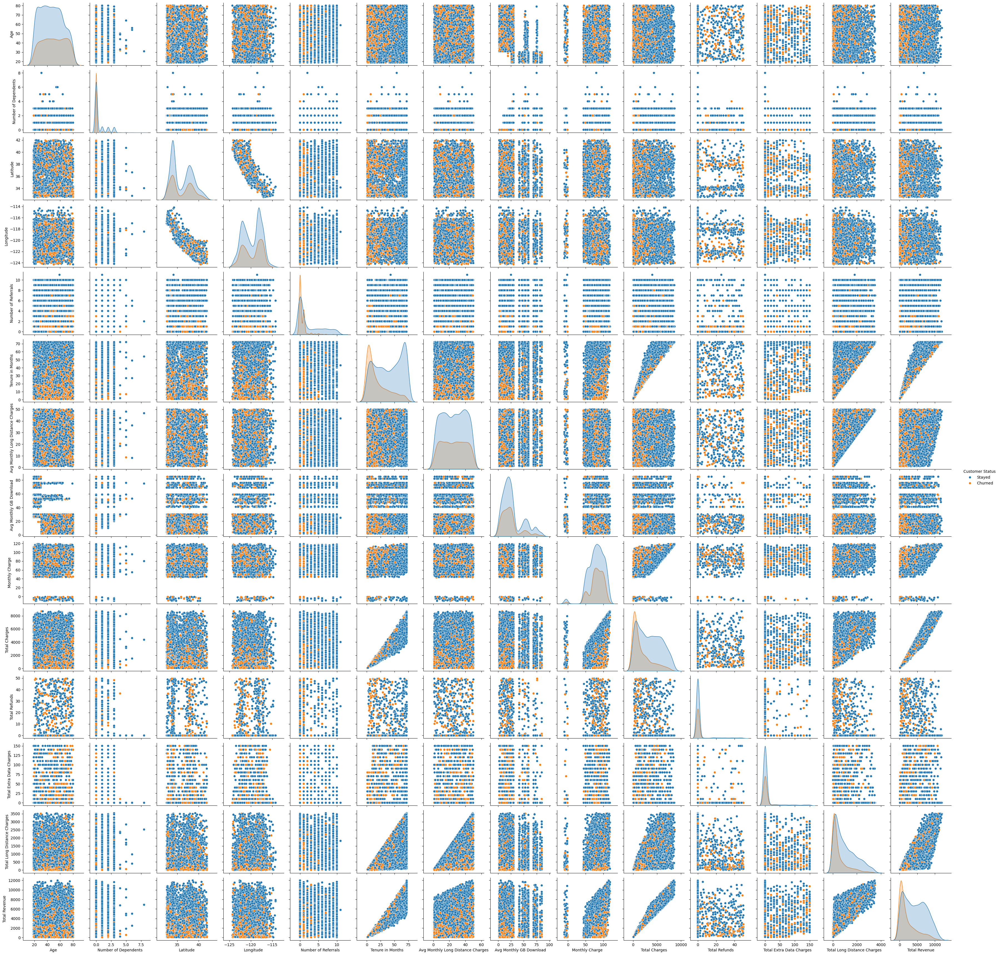

In [111]:
sns.pairplot(df,hue='Customer Status')
plt.show()

### Label Encoding for Object Datatypes

In [112]:
# Loop over each column in the DataFrame where dtype is 'object'
for col in df.select_dtypes(include=['object']).columns:

    # Print the column name and the unique values
    print(f"{col}: {df[col].unique()}")

Gender: ['Female' 'Male']
Married: ['Yes' 'No']
Offer: ['Offer E' 'Offer D' 'Offer A' 'Offer B' 'Offer C']
Phone Service: ['Yes']
Multiple Lines: ['No' 'Yes']
Internet Service: ['Yes']
Internet Type: ['Cable' 'Fiber Optic' 'DSL']
Online Security: ['No' 'Yes']
Online Backup: ['Yes' 'No']
Device Protection Plan: ['No' 'Yes']
Premium Tech Support: ['Yes' 'No']
Streaming TV: ['Yes' 'No']
Streaming Movies: ['No' 'Yes']
Streaming Music: ['No' 'Yes']
Unlimited Data: ['Yes' 'No']
Contract: ['One Year' 'Month-to-Month' 'Two Year']
Paperless Billing: ['Yes' 'No']
Payment Method: ['Credit Card' 'Bank Withdrawal' 'Mailed Check']
Customer Status: ['Stayed' 'Churned']


In [113]:
from sklearn import preprocessing

# loop over each column in the Dataframe where dtype is 'object'

for col in df.select_dtypes(include=['object']).columns:

    # Initialize a labelEncoder object
    label_encoder=preprocessing.LabelEncoder()

    # Fit the encoder to the uique values in the column
    label_encoder .fit(df[col].unique())

    # Transform the column using the encoder
    df[col] = label_encoder.transform(df[col])

    # print the column name and the unique encoder values
    print(f"{col}: {df[col].unique()}")

Gender: [0 1]
Married: [1 0]
Offer: [4 3 0 1 2]
Phone Service: [0]
Multiple Lines: [0 1]
Internet Service: [0]
Internet Type: [0 2 1]
Online Security: [0 1]
Online Backup: [1 0]
Device Protection Plan: [0 1]
Premium Tech Support: [1 0]
Streaming TV: [1 0]
Streaming Movies: [0 1]
Streaming Music: [0 1]
Unlimited Data: [1 0]
Contract: [1 0 2]
Paperless Billing: [1 0]
Payment Method: [1 0 2]
Customer Status: [1 0]


<Axes: >

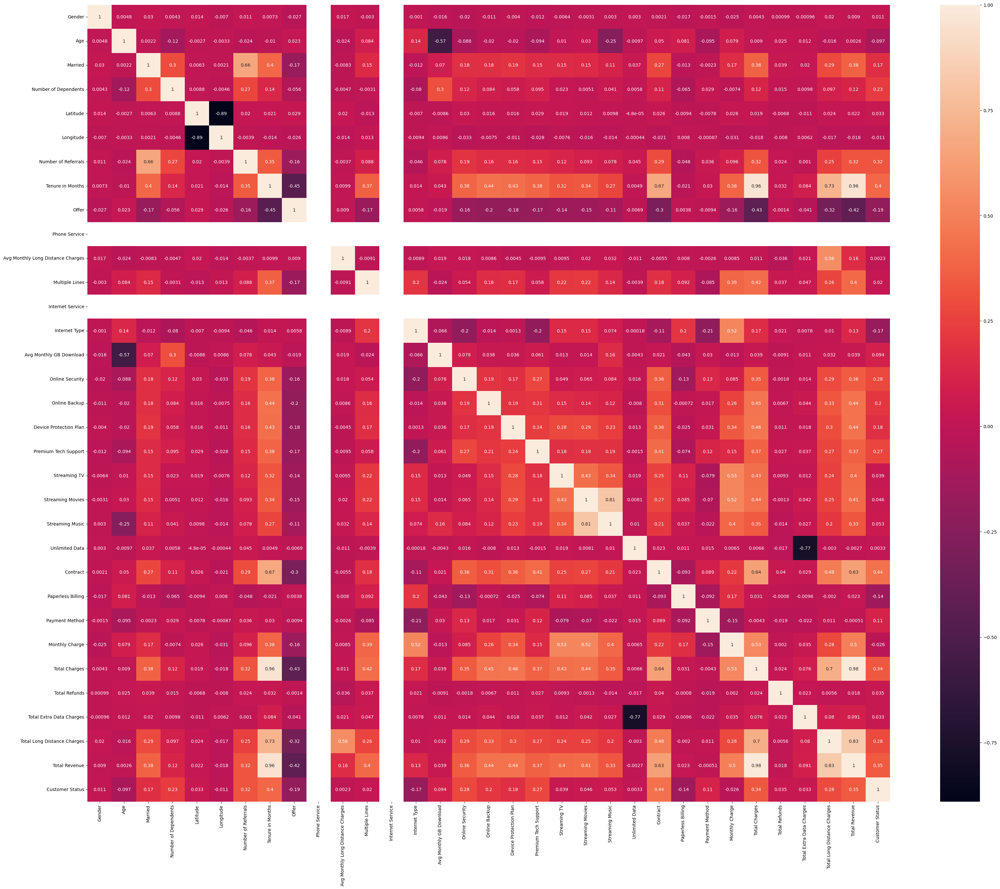

In [114]:
plt.figure(figsize=(40,32))
sns.heatmap(df.corr(),fmt='.2g',annot=True)

In [115]:
# Remove Internet Service and Phone Service column because of zero correlation
df.drop(columns = ['Internet Service', 'Phone Service'], inplace=True)
df.shape

(4835, 31)

### Insights
   
    - "Remove the Interent Service and phone Service column because of zero correlation"

In [116]:
df.to_csv("preprocessing_data.csv")